<a href="https://colab.research.google.com/github/sriharshini13/IIITH_INTERNSHIP/blob/main/TASK_5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project Title:
# **Automated Crop Health Monitoring Using YOLOv8**

#  Objective / Problem Statement:
Crop diseases significantly impact agricultural productivity, leading to reduced yields and economic losses. Early detection and classification of plant diseases are crucial to take timely corrective actions and ensure crop health. Traditional manual monitoring is time-consuming, error-prone, and requires expert intervention.

This project aims to develop an automated crop disease detection system using YOLOv8, a real-time object detection model, that can identify and classify diseases in various crops by analyzing leaf images.

#  Main Goal:

To build a computer vision-based system that:

Detects different types of crop diseases in real-time from leaf images.

Utilizes YOLOv8 object detection architecture for high accuracy and speed.

Trains the model using a custom-annotated dataset derived from publicly available sources (Kaggle + Roboflow).

Allows users to test the trained model on new images to detect plant diseases automatically.



# Step 1: Project Setup

**1.1. Create Folder Structure**

Open VS Code and create a main project folder named:

    CropHealthMonitoring/
Inside it, create the following subfolders:

    CropHealthMonitoring/
    ├── dataset/
    │   ├── train/
    │   │   ├── images/
    │   │   └── labels/
    │   ├── valid/
    │   │   ├── images/
    │   │   └── labels/
    │   └── data.yaml
    ├── images_to_test/               ← Batch test images go here
    ├── runs/
    │   ├── detect/
    │   │   ├── crop_health_model/   ← YOLOv8 trained model outputs
    │   │   ├── predict/             ← First prediction folder
    │   │   └── predict2/            ← Batch inference output (labels inside)
    ├── yolov8_train.py              ← Script for training
    ├── yolov8_infer_batch.py        ← Batch inference script (multi-image)
    ├── plot_detection_summary.py    ← Script to plot disease summary
    └── requirements.txt             ← Python dependencies

---
#Step 2: Environment Setup

**2.1. Install Python**

Install Python 3.10 or above from:
👉 https://www.python.org/downloads

During installation, enable “Add Python to PATH”.

**2.2. Create and Activate Virtual Environment (Recommended)**

In VS Code terminal:

    python -m venv venv
    venv\Scripts\activate     # On Windows

**2.3. Install Required Packages**
    pip install ultralytics opencv-python roboflow
---
#Step 3: Download Dataset

**3.1. Go to Kaggle**
Visit this dataset:
     https://www.kaggle.com/datasets/emmarex/plantdisease

Download and unzip the dataset.

**3.2. Organize the Images**

You will now annotate these images using Roboflow.

---

#Step 4: Annotate with Roboflow

**4.1. Sign in to Roboflow**
https://app.roboflow.com

**4.2. Create New Project**

Name: plant-disease-detection

Type: Object Detection

License: any

Upload your images (at least 100+ for good training)

**4.3. Annotate**

Manually draw bounding boxes around infected or healthy leaves.

Assign proper class labels like:

    Pepper__bell___Bacterial_spot
    Pepper__bell___healthy
    Potato___Early_blight
    Potato___Late_blight
    Potato___healthy
    Tomato_Septoria_leaf_spot
    Tomato__Target_Spot
    Tomato__Tomato_YellowLeaf__Curl_Virus
    Tomato__Tomato_mosaic_virus

**4.4. Generate and Download Dataset**

Click Generate Dataset → Click Download

Choose format: YOLOv8 PyTorch

Unzip the dataset and place the contents inside your dataset/ folder structure.

# Step 5: Verify Dataset
Check your folder structure:

    dataset/
    ├── train/
    │   ├── images/
    │   └── labels/
    ├── valid/
    │   ├── images/
    │   └── labels/
    ├── test/
    │   ├── images/
    │   └── labels/
    └── data.yaml

Check data.yaml:

yaml

      path: dataset
    train: train/images
    val: valid/images

    names:
      0: Bacterial_spot
      1: Early_blight
      2: Late_blight
      3: Leaf_Mold
      4: Septoria_leaf_spot
      5: Spider_mites
      6: Target_Spot
      7: Tomato_Yellow_Leaf_Curl_Virus
      8: Tomato_mosaic_virus
      9: healthy


---

#Step 6: Train YOLOv8

**6.1. yolov8_train.py**

python

      from ultralytics import YOLO

    model = YOLO("yolov8n.pt")

    model.train(
      data="dataset/data.yaml",
      epochs=30,
      imgsz=640,
      batch=8,
      name="crop_health_model",
      device="cpu"  # or 'cuda' for GPU
    )


**6.2. Run the Script**

    python yolov8_train.py

Output will be saved in runs/detect/crop_health_model/

---

#Step 7: Test with an Image

**7.1. Add a test folder(images_to_test)**

Put a sample leaf images to be tested in this folder.

**7.2.Run Inference on Multiple Test Images
(yolov8_infer_batch.py)**

      from ultralytics import YOLO
    import os

    # Load trained model
    model = YOLO("runs/detect/crop_health_model/weights/best.pt")

    # Folder containing test images
    test_folder = "images_to_test"

    # Run inference on all images
    for image_name in os.listdir(test_folder):
        if image_name.lower().endswith(('.jpg', '.png', '.jpeg')):
            image_path = os.path.join(test_folder, image_name)
            results = model(image_path, save=True, conf=0.25)
            print(f"✅ Processed: {image_name}")



**7.3. Run the Inference**

    python yolov8_infer.py

The prediction image will be saved in Output (images and labels) will be saved in runs/detect/predict2/

---

#Step 8:Generate Disease Summary Graphs
**8.1. plot_detection_summary.py**

    import os
    import matplotlib.pyplot as plt
    from collections import Counter

      label_folder = "runs/detect/predict2/labels"

    class_names = [
      "Bacterial_spot", "Early_blight", "Late_blight", "Leaf_Mold", "Septoria_leaf_spot",
      "Spider_mites", "Target_Spot", "Tomato_Yellow_Leaf_Curl_Virus",
      "Tomato_mosaic_virus", "healthy"
    ]

    # Count label frequencies
    label_counts = Counter()
    for filename in os.listdir(label_folder):
        if filename.endswith(".txt"):
            with open(os.path.join(label_folder, filename), "r") as f:
                for line in f:
                    label_index = int(line.split()[0])
                    label_counts[label_index] += 1

    # Prepare data
    labels = [class_names[i] for i in label_counts.keys()]
    counts = [label_counts[i] for i in label_counts.keys()]

    # Plot
    plt.figure(figsize=(12, 6))
    plt.bar(labels, counts, color='green')
    plt.title("Crop Disease Detection Summary")
    plt.xlabel("Disease Type")
    plt.ylabel("Number of Detections")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
**8.2. Run the detection**

Run this:

    python plot_detection_summary.py
Labels in predict2/labels.

A bar chart of how many diseased plants were detected for each category.

---


# Final Folder Summary

    CropHealthMonitoring/
    │
    ├── dataset/
    │   ├── data.yaml                     # Dataset config file (classes, paths)
    │   ├── train/
    │   │   └── images/                   # Training images
    │   │   └── labels/                   # Corresponding YOLO labels
    │   └── valid/
    │       └── images/                   # Validation images
    │       └── labels/                   # Corresponding YOLO labels
    │
    ├── images_to_test/
    │   └── test1.jpg                     # Multiple test images for inference
    │   └── test2.jpg
    │   └── ... etc
    │
    ├── runs/
    │   └── detect/
    │       ├── crop_health_model/       # YOLO training results
    │       │   └── weights/
    │       │       └── best.pt          # Best trained model checkpoint
    │       └── predict2/                # Batch inference results
    │           ├── labels/              # YOLO detection .txt label files
    │           ├── test1.jpg            # Output image with bounding boxes
    │           └── ... etc
    │
    ├── yolov8_train.py                  # Script to train YOLOv8 on your dataset
    ├── yolov8_infer_batch.py           # Script to run inference on multiple images
    ├── plot_detection_summary.py       # Script to summarize detections into a plot
    ├── requirements.txt                # (Optional) Required libraries
    └── README.md                       # (Optional) Project description


---

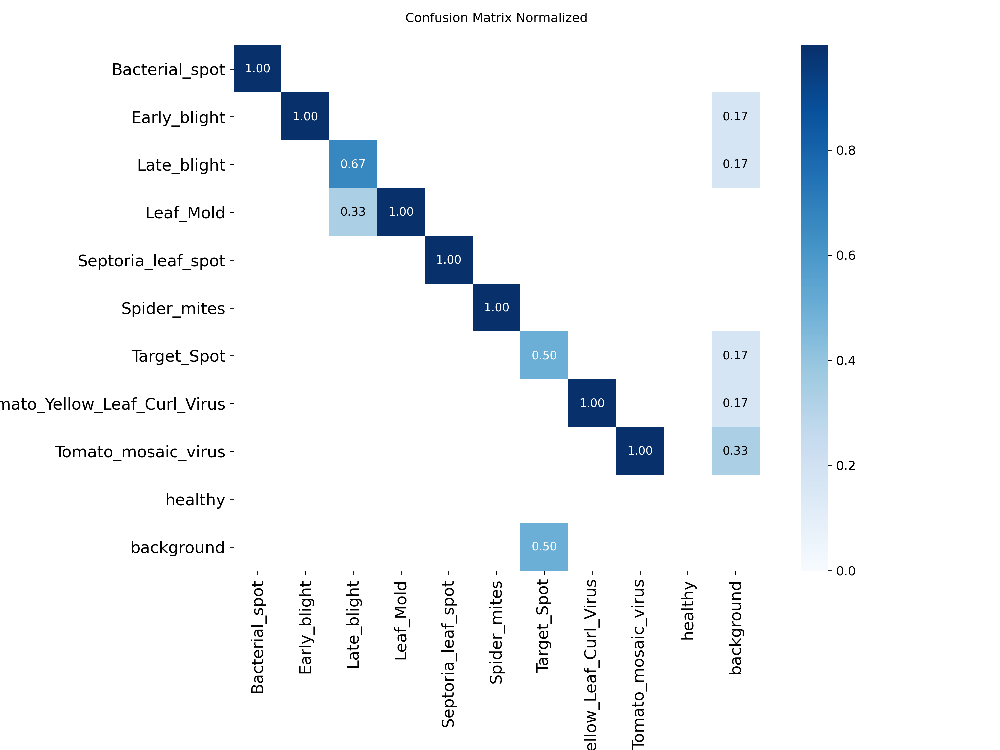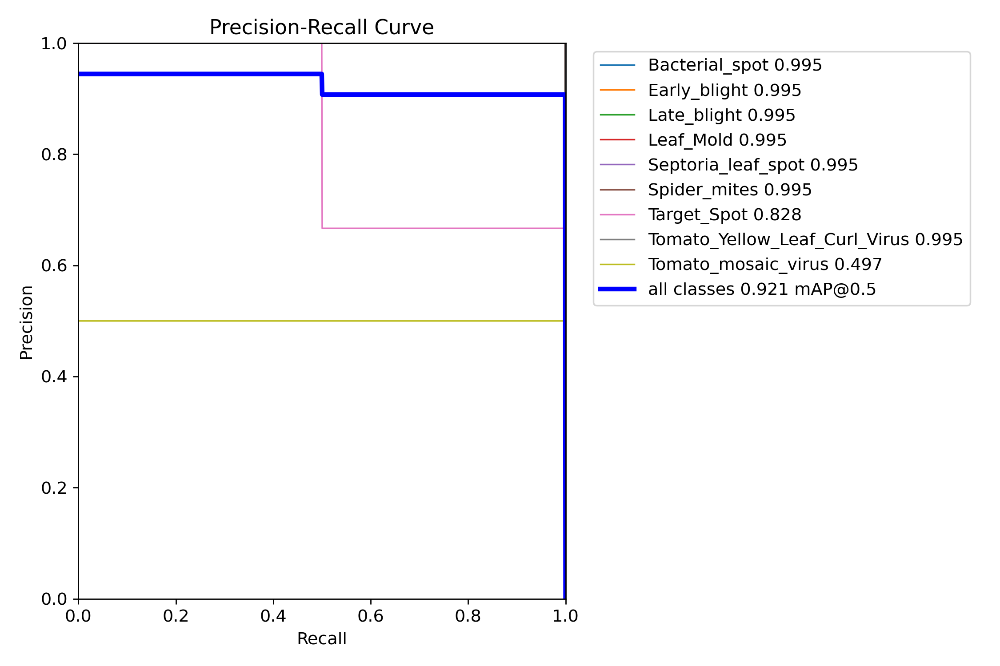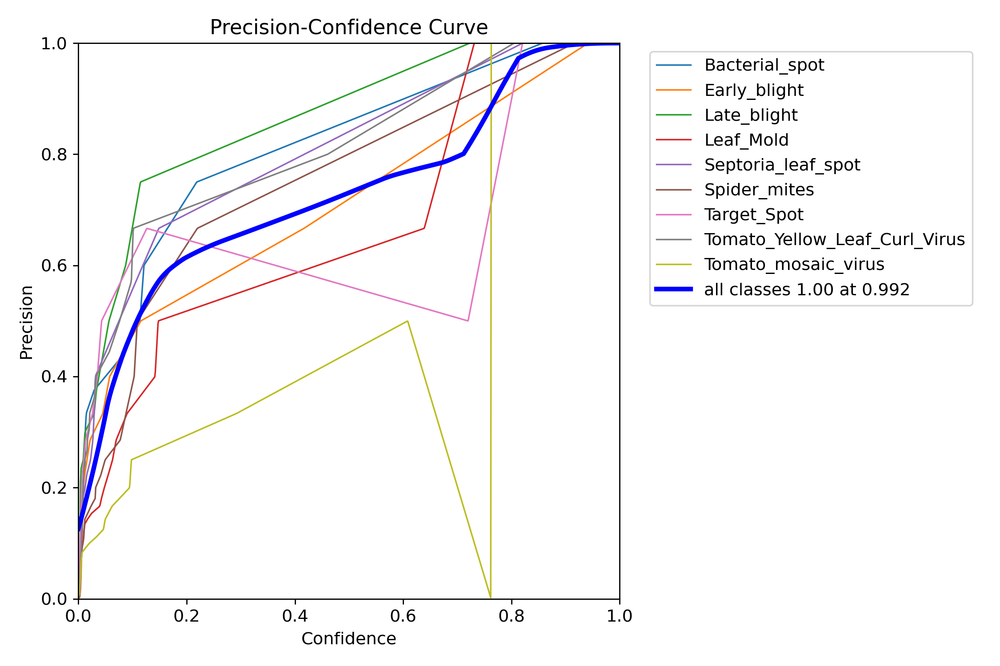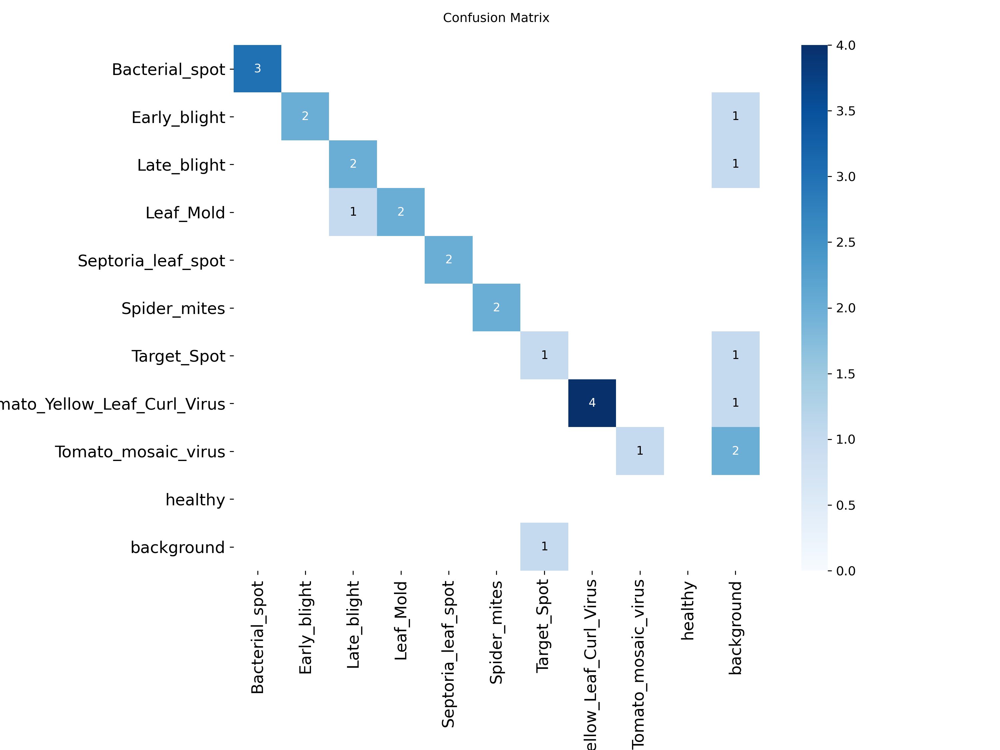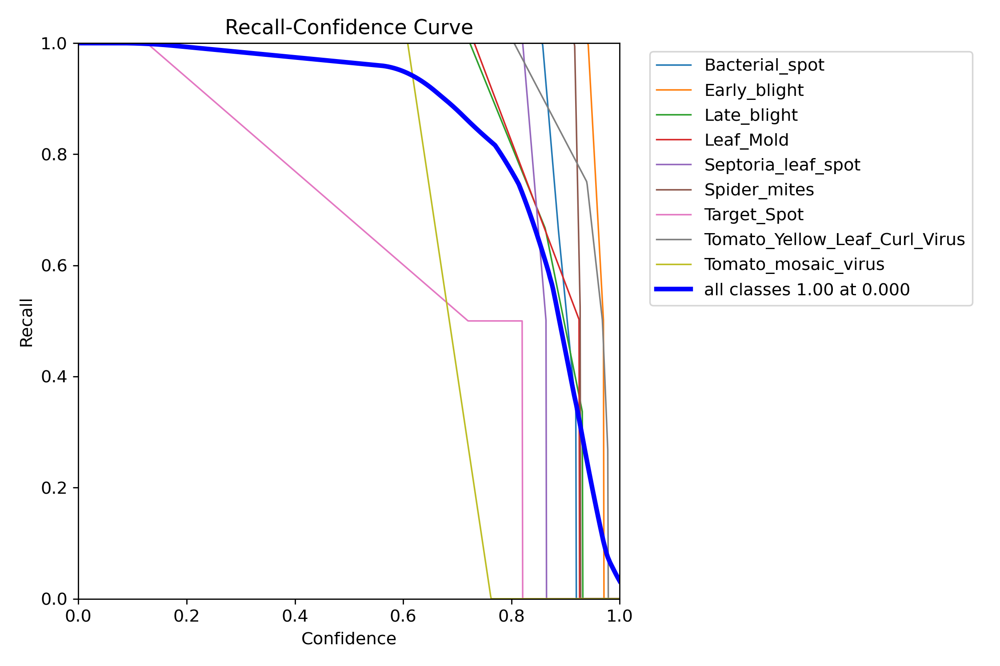
...
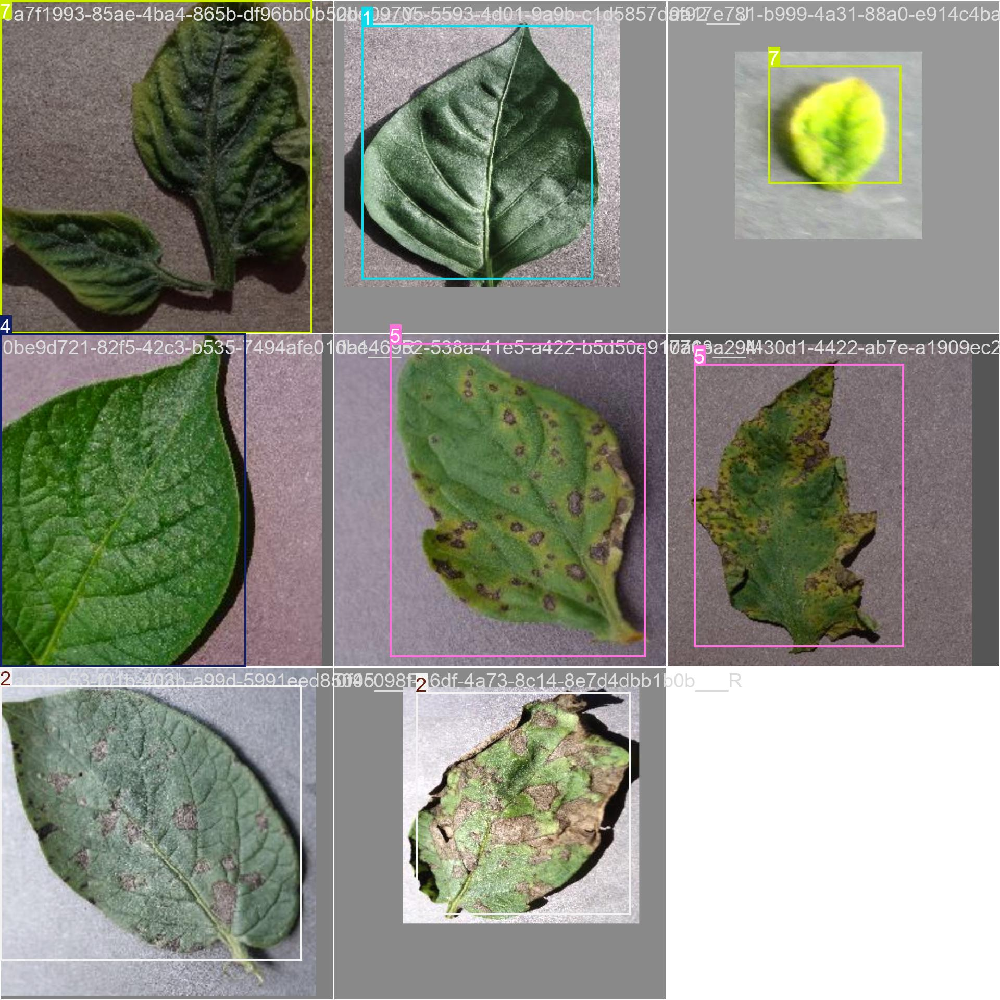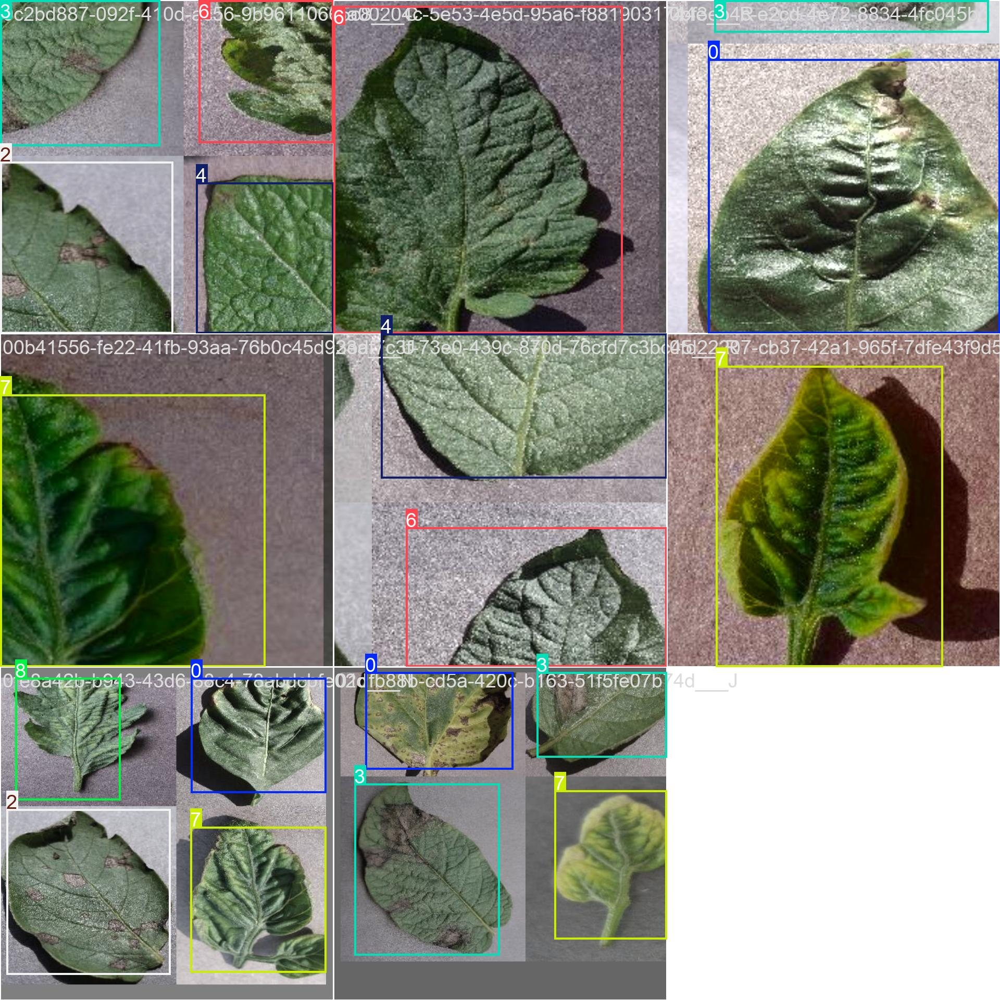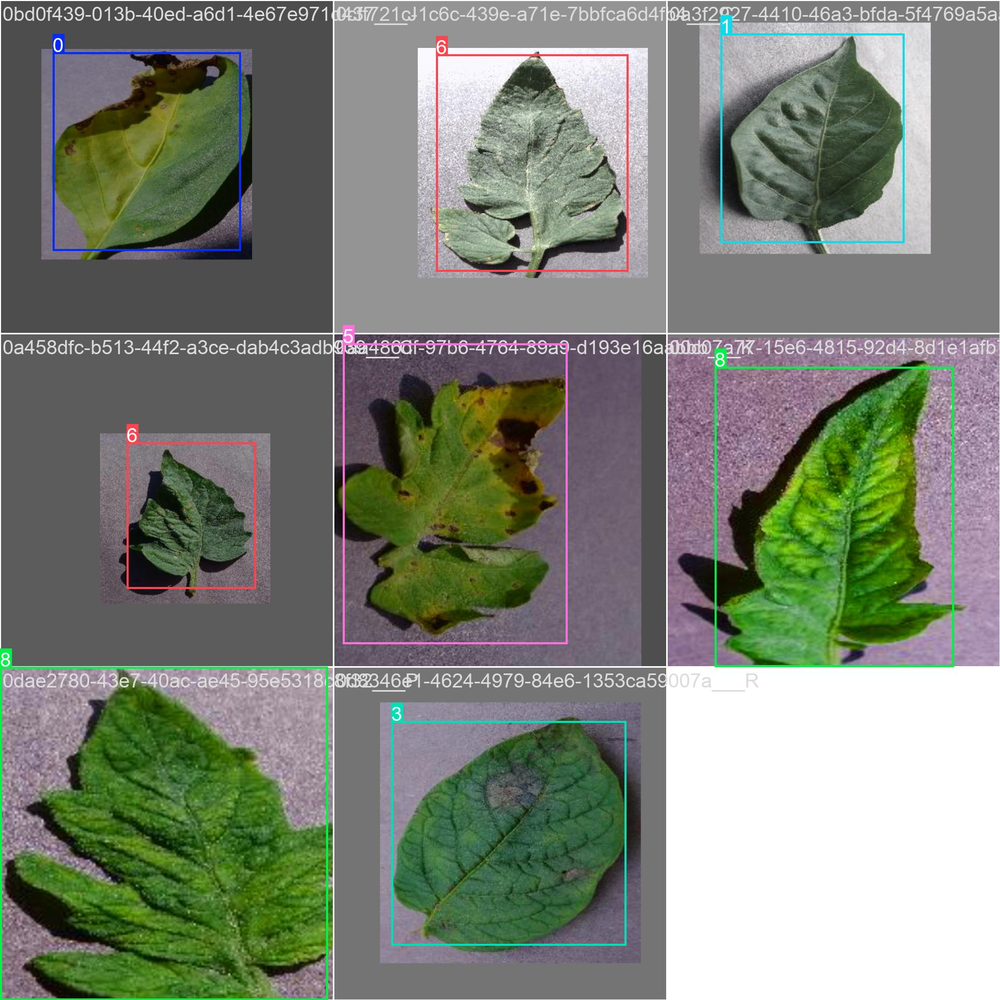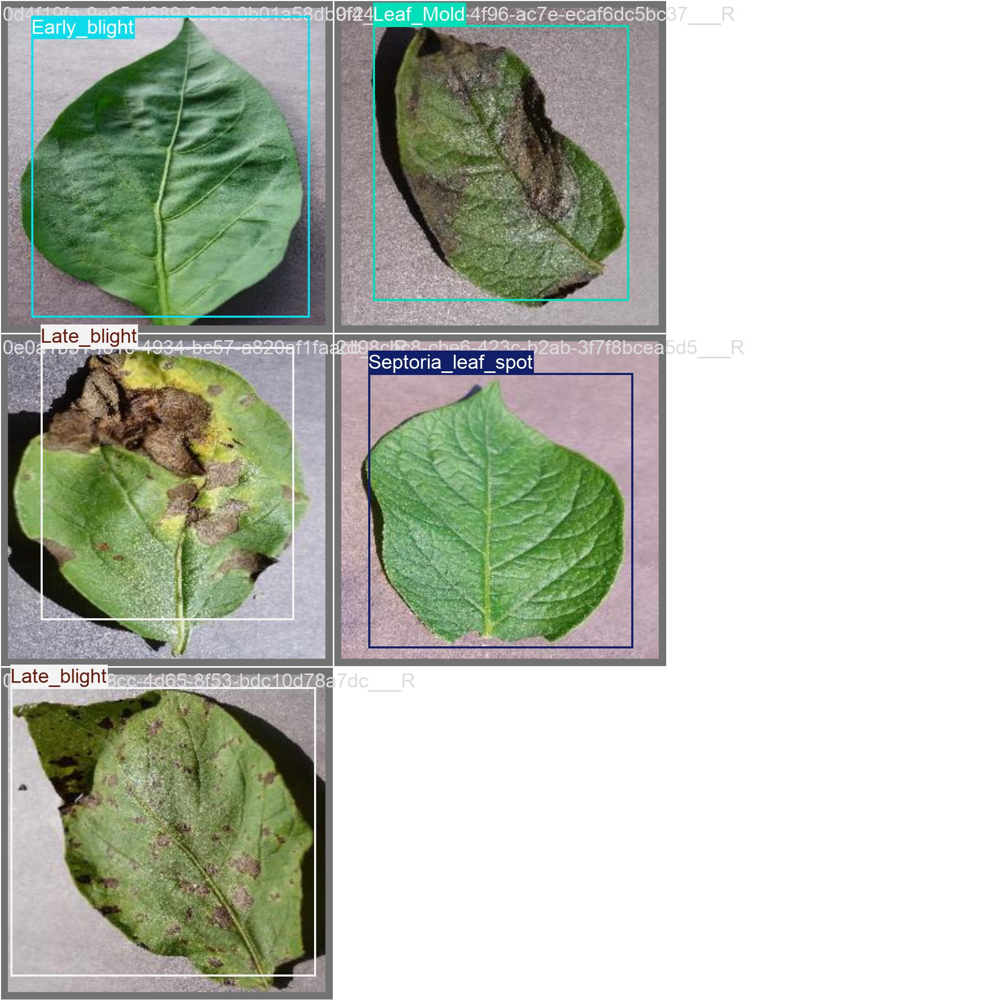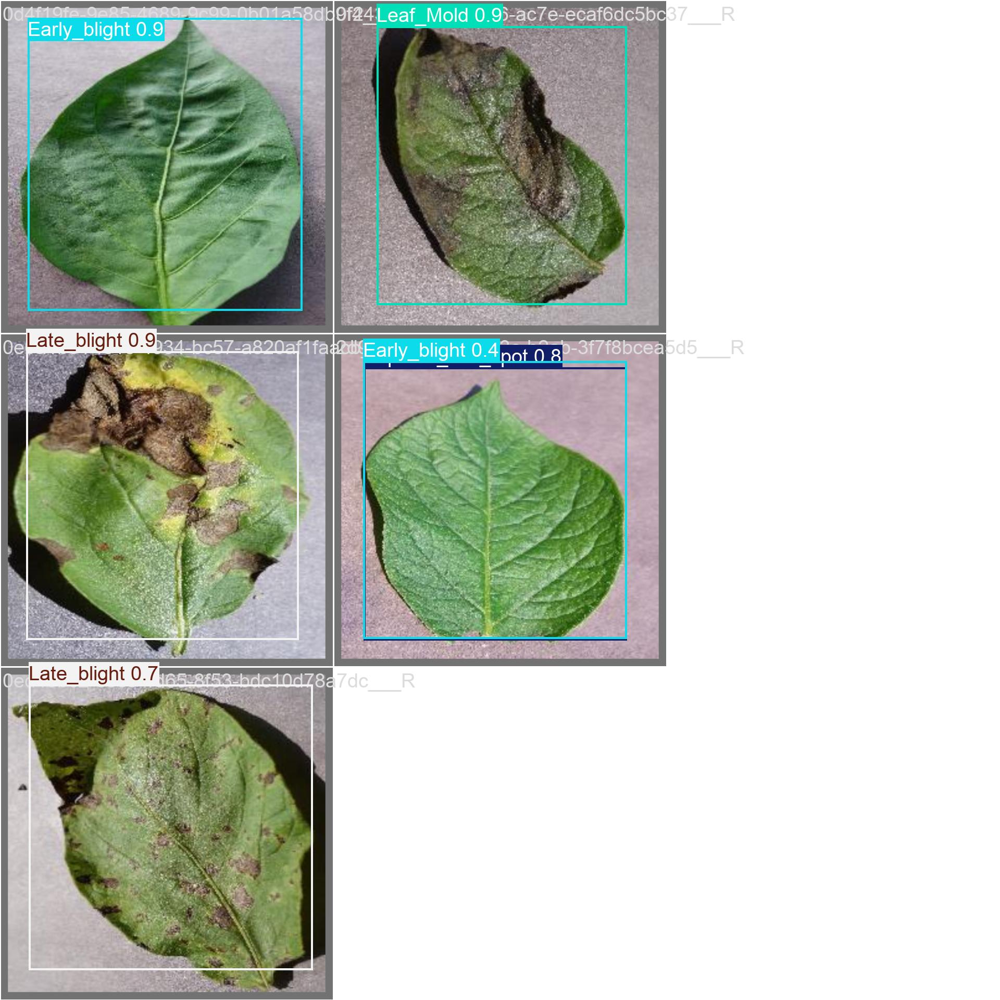

OUTPUTS OF TEST_IMAGES: \runs\detect\predict2

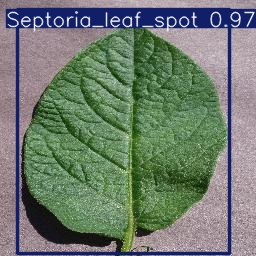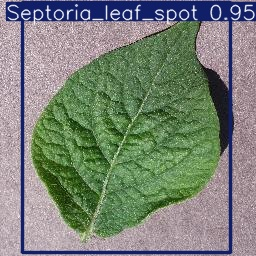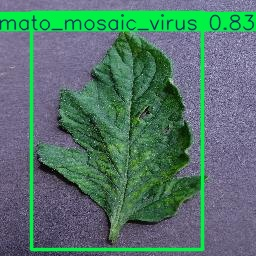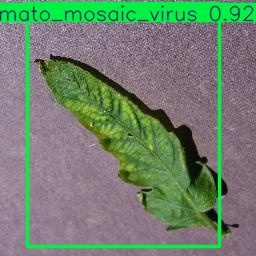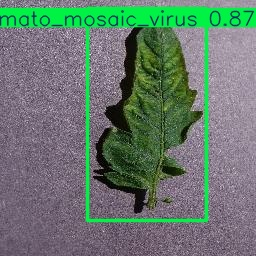
...
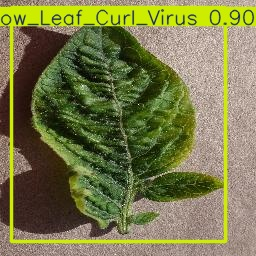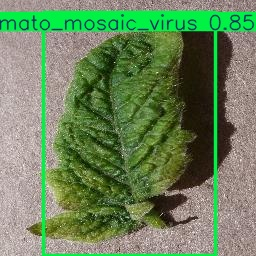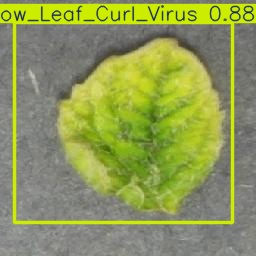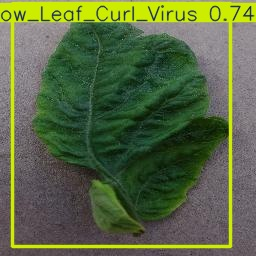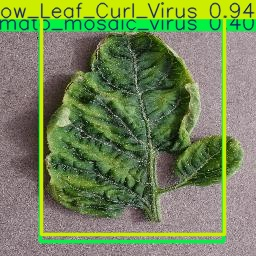

OUTPUT FOR THE SUMMARY GRAPH OF THE SAMPLE TEST IMAGES:

**BAR GRAPH**

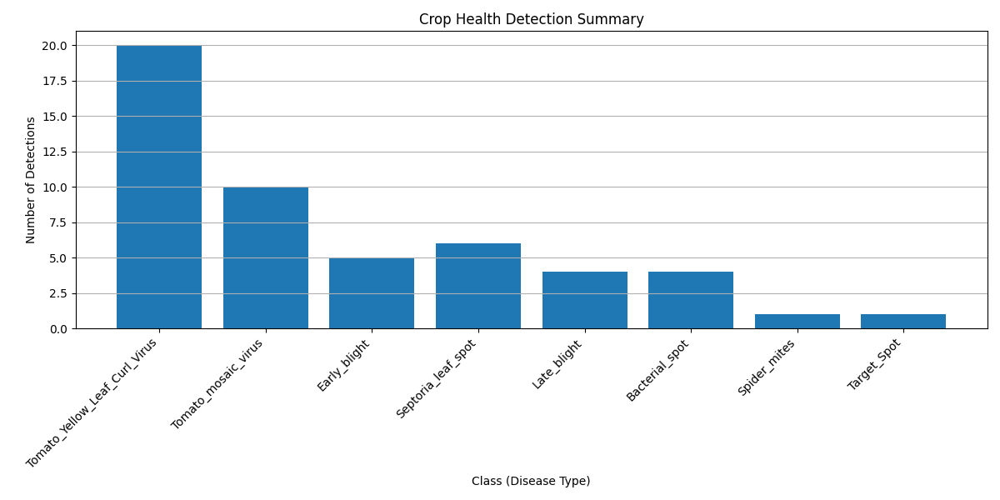